#Importing and Installing Libraries

In [ ]:
!pip install lime
!pip install KDEpy
!pip install fairlearn
!pip install scikit-learn==1.1.3
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=bf93054e1a2d4310afeae91d2f1e33249bc7dd3e3b236f71a9460f777fe23050
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 652.9/652.9 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.3/232.3 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 50.3 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.5.2
    Uninstalling scikit-learn-1.5.2:
      Successfully uninstalled scikit-learn-1.5.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigfram

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
#from KDEpy import FFTKDE
#import sklearn as sk
import seaborn as sns
import plotly.express as px
#import fairlearn as fl
#import eli5
import shap
#import lime as lm


In [ ]:
from KDEpy import FFTKDE
import eli5
import lime as lm
import fairlearn as fl

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
!pip install update scikit-learn

In [ ]:
import sklearn as sk

In [ ]:
import folium as fl

In [ ]:
from folium.plugins import HeatMap

#Importing Data

In [84]:
df = pd.read_csv("/content/Crimes_-_2019_20241207.csv")

In [ ]:
df.head(6)

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,11662417,JC232642,04/21/2019 12:30:00 PM,009XX E 80TH ST,031A,ROBBERY,ARMED - HANDGUN,RESIDENCE,False,False,...,8.0,44,03,1184044.0,1852159.0,2019,09/14/2023 03:41:59 PM,41.749500,-87.601157,"(41.749500329, -87.6011574)"
1,12990873,JG161829,08/17/2019 01:14:00 PM,008XX N KARLOV AVE,1751,OFFENSE INVOLVING CHILDREN,CRIMINAL SEXUAL ABUSE BY FAMILY MEMBER,RESIDENCE,True,True,...,37.0,23,17,1148899.0,1905351.0,2019,09/14/2023 03:41:59 PM,41.896215,-87.728572,"(41.89621515, -87.728572048)"
2,11630496,JC193727,03/16/2019 11:35:00 AM,045XX N LINCOLN AVE,0890,THEFT,FROM BUILDING,BAR OR TAVERN,False,False,...,47.0,4,06,NaN,NaN,2019,03/23/2019 04:03:16 PM,NaN,NaN,NaN
3,11632505,JC196841,03/20/2019 01:00:00 AM,013XX W HOOD AVE,0810,THEFT,OVER $500,OTHER,False,False,...,48.0,77,06,NaN,NaN,2019,03/27/2019 04:10:11 PM,NaN,NaN,NaN
4,11765926,JC358692,07/21/2019 02:00:00 PM,002XX W 87TH ST,0810,THEFT,OVER $500,PARKING LOT / GARAGE (NON RESIDENTIAL),False,False,...,21.0,44,06,1176436.0,1847222.0,2019,09/15/2023 03:41:25 PM,41.736127,-87.629184,"(41.736126864, -87.629184056)"
5,11885224,JC502442,11/05/2019 08:00:00 PM,075XX S RHODES AVE,031A,ROBBERY,ARMED - HANDGUN,STREET,False,True,...,6.0,69,03,1181207.0,1855239.0,2019,09/15/2023 03:41:25 PM,41.758018,-87.611459,"(41.75801796, -87.611458525)"


In [85]:
df = df.dropna()

In [86]:
df_for_heatmap = df[["Latitude", "Longitude"]]
#df_for_heatmap = df_for_heatmap.dropna()
df_for_heatmap.head()

,Latitude,Longitude
0,41.749500,-87.601157
1,41.896215,-87.728572
4,41.736127,-87.629184
5,41.758018,-87.611459
9,41.742736,-87.647510


In [ ]:
map_center = [df_for_heatmap["Latitude"].mean(), df_for_heatmap["Longitude"].mean()]
crimes_heatmap = fl.Map(location=map_center, zoom_start=15)
HeatMap(df_for_heatmap).add_to(crimes_heatmap)
crimes_heatmap

So far in this analysis, we have just taken a look at what the data says about Chicago and the frequency of crime in each area. Now, we start going towards prediction, by feature engineering, splitting the data, training multiple models and seeing how they each perform.

In [87]:
df['Date'] = pd.to_datetime(df['Date'])
df['hour'] = df['Date'].dt.hour
df['day_of_week'] = df['Date'].dt.dayofweek
df['month'] = df['Date'].dt.month
df['year'] = df['Date'].dt.year

In [88]:
df['hour_sin'] = np.sin(df['hour'] * (2 * np.pi / 24))
df['hour_cos'] = np.cos(df['hour'] * (2 * np.pi / 24))
df['day_of_week_sin'] = np.sin(df['day_of_week'] * (2 * np.pi / 7))
df['day_of_week_cos'] = np.cos(df['day_of_week'] * (2 * np.pi / 7))
df['mont_sin'] = np.sin(df['month'] * (2 * np.pi / 12))
df['month_cos'] = np.cos(df['month'] * (2 * np.pi / 12))

In [89]:
df = df.drop(['Case Number', 'IUCR', 'Updated On', 'Year', 'FBI Code', 'Description'], axis=1, errors='ignore')

In [ ]:
df.head()

,ID,Date,Block,Primary Type,Location Description,Arrest,Domestic,Beat,District,Ward,...,hour,day_of_week,month,year,hour_sin,hour_cos,day_of_week_sin,day_of_week_cos,mont_sin,month_cos
0,11662417,2019-04-21 12:30:00,009XX E 80TH ST,ROBBERY,RESIDENCE,False,False,631,6,8.0,...,12,6,4,2019,1.224647e-16,-1.000000,-0.781831,0.623490,0.866025,-5.000000e-01
1,12990873,2019-08-17 13:14:00,008XX N KARLOV AVE,OFFENSE INVOLVING CHILDREN,RESIDENCE,True,True,1111,11,37.0,...,13,5,8,2019,-2.588190e-01,-0.965926,-0.974928,-0.222521,-0.866025,-5.000000e-01
2,11630496,2019-03-16 11:35:00,045XX N LINCOLN AVE,THEFT,BAR OR TAVERN,False,False,1911,19,47.0,...,11,5,3,2019,2.588190e-01,-0.965926,-0.974928,-0.222521,1.000000,6.123234e-17
3,11632505,2019-03-20 01:00:00,013XX W HOOD AVE,THEFT,OTHER,False,False,2433,24,48.0,...,1,2,3,2019,2.588190e-01,0.965926,0.974928,-0.222521,1.000000,6.123234e-17
4,11765926,2019-07-21 14:00:00,002XX W 87TH ST,THEFT,PARKING LOT / GARAGE (NON RESIDENTIAL),False,False,622,6,21.0,...,14,6,7,2019,-5.000000e-01,-0.866025,-0.781831,0.623490,-0.500000,-8.660254e-01


In [ ]:
print(df['Primary Type'].unique())

['PROPERTY THEFT' 'OFFENSE INVOLVING CHILDREN' 'SEX CRIMES' 'HOMICIDE'
 'CRIMES AGAINST PUBLIC' 'VIOLENT CRIMES' 'OTHER OFFENSE'
 'SUBSTANCE CRIMES' 'CRIMINAL TRESPASS'
 'CONCEALED CARRY LICENSE VIOLATION' 'ABDUCTION AND EXPLOITATION'
 'GAMBLING' 'NON-CRIMINAL']


In [90]:
crime_mapping = {
    "ROBBERY": "PROPERTY THEFT",
    "THEFT": "PROPERTY THEFT",
    "BURGLARY": "PROPERTY THEFT",
    "MOTOR VEHICLE THEFT": "PROPERTY THEFT",
    "CRIMINAL SEXUAL ASSAULT": "SEX CRIMES",
    "STALKING": "SEX CRIMES",
    "SEX OFFENSE": "SEX CRIMES",
    "CRIM SEXUAL ASSAULT": "SEX CRIMES",
    "PROSTITUTION": "SEX CRIMES",
    "BATTERY": "VIOLENT CRIMES",
    "WEAPONS VIOLATION": "VIOLENT CRIMES",
    "ASSAULT": "VIOLENT CRIMES",
    "CRIMINAL DAMAGE": "VIOLENT CRIMES",
    "ARSON": "VIOLENT CRIMES",
    "INTIMIDATION": "VIOLENT CRIMES",
    "NARCOTICS": "SUBSTANCE CRIMES",
    "LIQUOR LAW VIOLATION": "SUBSTANCE CRIMES",
    "OTHER NARCOTIC VIOLATION": "SUBSTANCE CRIMES",
    "PUBLIC INDECENCY": "CRIMES AGAINST PUBLIC",
    "OBSCENITY": "CRIMES AGAINST PUBLIC",
    "PUBLIC PEACE VIOLATION": "CRIMES AGAINST PUBLIC",
    "INTERFERENCE WITH PUBLIC OFFICER": "CRIMES AGAINST PUBLIC",
    "DECEPTIVE PRACTICE": "CRIMES AGAINST PUBLIC",
    "HUMAN TRAFFICKING": "ABDUCTION AND EXPLOITATION",
    "KIDNAPPING": "ABDUCTION AND EXPLOITATION"
}

df['Primary Type'] = df['Primary Type'].replace(crime_mapping)

print(df['Primary Type'].unique())

['PROPERTY THEFT' 'OFFENSE INVOLVING CHILDREN' 'HOMICIDE' 'SEX CRIMES'
 'VIOLENT CRIMES' 'OTHER OFFENSE' 'SUBSTANCE CRIMES' 'CRIMINAL TRESPASS'
 'CRIMES AGAINST PUBLIC' 'CONCEALED CARRY LICENSE VIOLATION'
 'ABDUCTION AND EXPLOITATION' 'GAMBLING' 'NON-CRIMINAL']


In [ ]:
print(df['Location Description'].unique())

['RESIDENCE' 'PARKING LOT / GARAGE (NON RESIDENTIAL)' 'STREET' 'ALLEY'
 'RESIDENCE - GARAGE' 'COMMERCIAL / BUSINESS OFFICE' 'APARTMENT'
 'OTHER (SPECIFY)' 'RESIDENCE - PORCH / HALLWAY' 'GAS STATION' 'SIDEWALK'
 'GROCERY FOOD STORE' 'AUTO' 'OTHER' 'SCHOOL, PUBLIC, BUILDING'
 'SMALL RETAIL STORE' 'AUTO / BOAT / RV DEALERSHIP' 'DEPARTMENT STORE'
 'RESTAURANT' 'RESIDENCE-GARAGE' 'LIBRARY'
 'OTHER RAILROAD PROPERTY / TRAIN DEPOT' 'SCHOOL - PUBLIC GROUNDS'
 'PARK PROPERTY' 'HOTEL / MOTEL' 'CTA TRAIN' 'CTA BUS' 'PORCH' 'HOUSE'
 'PARKING LOT' 'YARD' 'HOTEL' 'STAIRWELL' 'VACANT LOT'
 'BARBER SHOP/BEAUTY SALON' 'CHA PLAY LOT' 'RAILROAD PROPERTY'
 'CHA PARKING LOT' 'TRAILER' 'GARAGE' 'GANGWAY' 'CTA SUBWAY STATION'
 'BASEMENT' 'RETAIL STORE' 'CHA GROUNDS' 'CTA "L" PLATFORM'
 'VEHICLE NON-COMMERCIAL' 'RESIDENTIAL YARD (FRONT/BACK)'
 'OTHER COMMERCIAL TRANSPORTATION' 'TAXICAB'
 'VEHICLE - OTHER RIDE SHARE SERVICE (E.G., UBER, LYFT)'
 'FEDERAL BUILDING' 'SCHOOL, PUBLIC, GROUNDS' 'CHA APARTMENT'
 'VEH

In [91]:
df['Location Description'] = df['Location Description'].replace({
    "RESIDENCE": "Residential Areas",
    "RESIDENCE - GARAGE": "Residential Areas",
    "APARTMENT": "Residential Areas",
    "RESIDENCE - PORCH / HALLWAY": "Residential Areas",
    "HOUSE": "Residential Areas",
    "YARD": "Residential Areas",
    "RESIDENTIAL YARD (FRONT/BACK)": "Residential Areas",
    "RESIDENCE PORCH/HALLWAY": "Residential Areas",
    "CHA APARTMENT": "Residential Areas",
    "DRIVEWAY - RESIDENTIAL": "Residential Areas",
    "RESIDENCE - YARD (FRONT / BACK)": "Residential Areas",
    "CHA HALLWAY/STAIRWELL/ELEVATOR": "Residential Areas",
    "STREET": "Public Outdoor Spaces",
    "SIDEWALK": "Public Outdoor Spaces",
    "ALLEY": "Public Outdoor Spaces",
    "PARK PROPERTY": "Public Outdoor Spaces",
    "VACANT LOT": "Public Outdoor Spaces",
    "LAKEFRONT/WATERFRONT/RIVERBANK": "Public Outdoor Spaces",
    "FOREST PRESERVE": "Public Outdoor Spaces",
    "BRIDGE": "Public Outdoor Spaces",
    "HIGHWAY / EXPRESSWAY": "Public Outdoor Spaces",
    "PARKING LOT": "Public Outdoor Spaces",
    "GROCERY FOOD STORE": "Commercial and Retail Spaces",
    "SMALL RETAIL STORE": "Commercial and Retail Spaces",
    "DEPARTMENT STORE": "Commercial and Retail Spaces",
    "RETAIL STORE": "Commercial and Retail Spaces",
    "CONVENIENCE STORE": "Commercial and Retail Spaces",
    "BAR OR TAVERN": "Commercial and Retail Spaces",
    "TAVERN / LIQUOR STORE": "Commercial and Retail Spaces",
    "BARBER SHOP/BEAUTY SALON": "Commercial and Retail Spaces",
    "CAR WASH": "Commercial and Retail Spaces",
    "APPLIANCE STORE": "Commercial and Retail Spaces",
    "WAREHOUSE": "Commercial and Retail Spaces",
    "CURRENCY EXCHANGE": "Commercial and Retail Spaces",
    "PAWN SHOP": "Commercial and Retail Spaces",
    "VEHICLE NON-COMMERCIAL": "Transportation-Related Locations",
    "TAXICAB": "Transportation-Related Locations",
    "VEHICLE - COMMERCIAL": "Transportation-Related Locations",
    "VEHICLE - DELIVERY TRUCK": "Transportation-Related Locations",
    "VEHICLE - OTHER RIDE SHARE SERVICE (E.G., UBER, LYFT)": "Transportation-Related Locations",
    "CTA BUS": "Transportation-Related Locations",
    "CTA TRAIN": "Transportation-Related Locations",
    "CTA PLATFORM": "Transportation-Related Locations",
    "AIRPORT TERMINAL LOWER LEVEL - SECURE AREA": "Transportation-Related Locations",
    "AIRPORT BUILDING NON-TERMINAL - NON-SECURE AREA": "Transportation-Related Locations",
    "AIRPORT PARKING LOT": "Transportation-Related Locations",
    "SCHOOL, PUBLIC, BUILDING": "Educational Institutions",
    "SCHOOL, PUBLIC, GROUNDS": "Educational Institutions",
    "SCHOOL, PRIVATE, BUILDING": "Educational Institutions",
    "SCHOOL, PRIVATE, GROUNDS": "Educational Institutions",
    "COLLEGE/UNIVERSITY GROUNDS": "Educational Institutions",
    "COLLEGE/UNIVERSITY RESIDENCE HALL": "Educational Institutions",
    "HOSPITAL BUILDING/GROUNDS": "Healthcare and Emergency Services",
    "MEDICAL/DENTAL OFFICE": "Healthcare and Emergency Services",
    "ANIMAL HOSPITAL": "Healthcare and Emergency Services",
    "NURSING / RETIREMENT HOME": "Healthcare and Emergency Services",
    "JAIL / LOCK-UP FACILITY": "Healthcare and Emergency Services",
    "FIRE STATION": "Healthcare and Emergency Services",
    "SPORTS ARENA/STADIUM": "Recreational and Leisure Areas",
    "BOWLING ALLEY": "Recreational and Leisure Areas",
    "POOL ROOM": "Recreational and Leisure Areas",
    "MOVIE HOUSE/THEATER": "Recreational and Leisure Areas",
    "ATHLETIC CLUB": "Recreational and Leisure Areas",
    "DAY CARE CENTER": "Recreational and Leisure Areas",
    "GOVERNMENT BUILDING/PROPERTY": "Government and Institutional Spaces",
    "FEDERAL BUILDING": "Government and Institutional Spaces",
    "POLICE FACILITY / VEHICLE PARKING LOT": "Government and Institutional Spaces",
    "OTHER": "Miscellaneous",
    "VACANT LOT / LAND": "Miscellaneous",
    "CHA PARKING LOT": "Miscellaneous",
    "CHA GROUNDS": "Miscellaneous"
})

# Check the unique values in the 'Location Description' column after replacement
print(df['Location Description'].unique())


['Residential Areas' 'PARKING LOT / GARAGE (NON RESIDENTIAL)'
 'Public Outdoor Spaces' 'COMMERCIAL / BUSINESS OFFICE' 'OTHER (SPECIFY)'
 'GAS STATION' 'Commercial and Retail Spaces' 'AUTO' 'Miscellaneous'
 'Educational Institutions' 'AUTO / BOAT / RV DEALERSHIP' 'RESTAURANT'
 'RESIDENCE-GARAGE' 'LIBRARY' 'OTHER RAILROAD PROPERTY / TRAIN DEPOT'
 'SCHOOL - PUBLIC GROUNDS' 'HOTEL / MOTEL'
 'Transportation-Related Locations' 'PORCH' 'HOTEL' 'STAIRWELL'
 'CHA PLAY LOT' 'RAILROAD PROPERTY' 'TRAILER' 'GARAGE' 'GANGWAY'
 'CTA SUBWAY STATION' 'BASEMENT' 'CTA "L" PLATFORM'
 'OTHER COMMERCIAL TRANSPORTATION' 'Government and Institutional Spaces'
 'VEHICLE-COMMERCIAL' 'NURSING HOME/RETIREMENT HOME'
 'PARKING LOT/GARAGE(NON.RESID.)' 'Healthcare and Emergency Services'
 'BARBERSHOP' 'POLICE FACILITY/VEH PARKING LOT' 'VACANT LOT/LAND'
 'CTA STATION' 'HOTEL/MOTEL' 'BANK' 'CHA PARKING LOT/GROUNDS'
 'Recreational and Leisure Areas' 'ABANDONED BUILDING'
 'TAVERN/LIQUOR STORE' 'CTA BUS STOP' 'HIGHWAY/EXPR

In [92]:
# Normalize column for consistency
df['Location Description'] = df['Location Description'].str.strip().str.upper()

# Define replacement dictionary
replacement_dict = {
    # Residential Areas
    "RESIDENCE": "Residential Areas",
    "RESIDENCE - GARAGE": "Residential Areas",
    "APARTMENT": "Residential Areas",
    "RESIDENCE-GARAGE": "Residential Areas",
    "HOUSE": "Residential Areas",
    "YARD": "Residential Areas",
    "RESIDENTIAL YARD (FRONT/BACK)": "Residential Areas",
    "RESIDENCE PORCH/HALLWAY": "Residential Areas",
    "CHA APARTMENT": "Residential Areas",
    "DRIVEWAY - RESIDENTIAL": "Residential Areas",
    "RESIDENCE - YARD (FRONT / BACK)": "Residential Areas",

    # Public Outdoor Spaces
    "STREET": "Public Outdoor Spaces",
    "SIDEWALK": "Public Outdoor Spaces",
    "ALLEY": "Public Outdoor Spaces",
    "PARK PROPERTY": "Public Outdoor Spaces",
    "VACANT LOT": "Public Outdoor Spaces",
    "LAKEFRONT/WATERFRONT/RIVERBANK": "Public Outdoor Spaces",
    "FOREST PRESERVE": "Public Outdoor Spaces",
    "BRIDGE": "Public Outdoor Spaces",
    "HIGHWAY / EXPRESSWAY": "Public Outdoor Spaces",
    "PARKING LOT": "Public Outdoor Spaces",

    # Commercial and Retail Spaces
    "GROCERY FOOD STORE": "Commercial and Retail Spaces",
    "SMALL RETAIL STORE": "Commercial and Retail Spaces",
    "DEPARTMENT STORE": "Commercial and Retail Spaces",
    "RETAIL STORE": "Commercial and Retail Spaces",
    "CONVENIENCE STORE": "Commercial and Retail Spaces",
    "BAR OR TAVERN": "Commercial and Retail Spaces",
    "TAVERN / LIQUOR STORE": "Commercial and Retail Spaces",
    "BARBER SHOP/BEAUTY SALON": "Commercial and Retail Spaces",
    "CAR WASH": "Commercial and Retail Spaces",
    "APPLIANCE STORE": "Commercial and Retail Spaces",
    "WAREHOUSE": "Commercial and Retail Spaces",
    "CURRENCY EXCHANGE": "Commercial and Retail Spaces",
    "PAWN SHOP": "Commercial and Retail Spaces",

    # Healthcare and Emergency Services
    "HOSPITAL BUILDING/GROUNDS": "Healthcare and Emergency Services",
    "MEDICAL/DENTAL OFFICE": "Healthcare and Emergency Services",
    "ANIMAL HOSPITAL": "Healthcare and Emergency Services",
    "NURSING / RETIREMENT HOME": "Healthcare and Emergency Services",
    "JAIL / LOCK-UP FACILITY": "Healthcare and Emergency Services",
    "FIRE STATION": "Healthcare and Emergency Services",

    # Transportation-Related Locations
    "VEHICLE NON-COMMERCIAL": "Transportation-Related Locations",
    "TAXICAB": "Transportation-Related Locations",
    "VEHICLE - COMMERCIAL": "Transportation-Related Locations",
    "VEHICLE - DELIVERY TRUCK": "Transportation-Related Locations",
    "VEHICLE - OTHER RIDE SHARE SERVICE (E.G., UBER, LYFT)": "Transportation-Related Locations",
    "CTA BUS": "Transportation-Related Locations",
    "CTA TRAIN": "Transportation-Related Locations",
    "CTA PLATFORM": "Transportation-Related Locations",
    "AIRPORT TERMINAL LOWER LEVEL - SECURE AREA": "Transportation-Related Locations",
    "AIRPORT BUILDING NON-TERMINAL - NON-SECURE AREA": "Transportation-Related Locations",
    "AIRPORT PARKING LOT": "Transportation-Related Locations",

    # Educational Institutions
    "SCHOOL, PUBLIC, BUILDING": "Educational Institutions",
    "SCHOOL, PUBLIC, GROUNDS": "Educational Institutions",
    "SCHOOL, PRIVATE, BUILDING": "Educational Institutions",
    "SCHOOL, PRIVATE, GROUNDS": "Educational Institutions",
    "COLLEGE/UNIVERSITY GROUNDS": "Educational Institutions",
    "COLLEGE/UNIVERSITY RESIDENCE HALL": "Educational Institutions",

    # Recreational and Leisure Areas
    "SPORTS ARENA/STADIUM": "Recreational and Leisure Areas",
    "BOWLING ALLEY": "Recreational and Leisure Areas",
    "POOL ROOM": "Recreational and Leisure Areas",
    "MOVIE HOUSE/THEATER": "Recreational and Leisure Areas",
    "ATHLETIC CLUB": "Recreational and Leisure Areas",
    "DAY CARE CENTER": "Recreational and Leisure Areas",

    # Government and Institutional Spaces
    "GOVERNMENT BUILDING/PROPERTY": "Government and Institutional Spaces",
    "FEDERAL BUILDING": "Government and Institutional Spaces",
    "POLICE FACILITY / VEHICLE PARKING LOT": "Government and Institutional Spaces",

    # Miscellaneous
    "OTHER": "Miscellaneous",
    "VACANT LOT / LAND": "Miscellaneous",
    "CHA PARKING LOT": "Miscellaneous",
    "CHA GROUNDS": "Miscellaneous"
    # Add more mappings as needed
}

# Apply replacements
df['Location Description'] = df['Location Description'].replace(replacement_dict)

# Identify unmatched values
unmatched_values = set(df['Location Description']) - set(replacement_dict.values())
print("Unmatched values:", unmatched_values)


Unmatched values: {'GANGWAY', 'GOVERNMENT BUILDING / PROPERTY', 'SCHOOL - PRIVATE GROUNDS', 'NEWSSTAND', 'SCHOOL - PUBLIC GROUNDS', 'BOAT / WATERCRAFT', 'AIRPORT TERMINAL UPPER LEVEL - SECURE AREA', 'LIBRARY', 'RESTAURANT', 'CTA BUS STOP', 'GAS STATION', 'CHA PARKING LOT / GROUNDS', 'SPORTS ARENA / STADIUM', 'HIGHWAY/EXPRESSWAY', 'CTA STATION', 'DRUG STORE', 'FACTORY/MANUFACTURING BUILDING', 'RAILROAD PROPERTY', 'AIRPORT/AIRCRAFT', 'CTA "L" PLATFORM', 'AIRCRAFT', 'SCHOOL - PUBLIC BUILDING', 'CHURCH/SYNAGOGUE/PLACE OF WORSHIP', 'PUBLIC OUTDOOR SPACES', 'BARBERSHOP', 'AIRPORT BUILDING NON-TERMINAL - SECURE AREA', 'BASEMENT', 'HOTEL', 'CHA PARKING LOT/GROUNDS', 'VACANT LOT/LAND', 'LAKEFRONT / WATERFRONT / RIVERBANK', 'CTA GARAGE / OTHER PROPERTY', 'KENNEL', 'AIRPORT VENDING ESTABLISHMENT', 'PORCH', 'CREDIT UNION', 'AUTO / BOAT / RV DEALERSHIP', 'COIN OPERATED MACHINE', 'AIRPORT TRANSPORTATION SYSTEM (ATS)', 'BOAT/WATERCRAFT', 'CTA PARKING LOT / GARAGE / OTHER PROPERTY', 'TAVERN/LIQUOR STO

In [93]:
replacement_dict.update({
    "MEDICAL / DENTAL OFFICE": "Healthcare and Emergency Services",
    "GOVERNMENT BUILDING / PROPERTY": "Government and Institutional Spaces",
    "GAS STATION": "Commercial and Retail Spaces",
    "BOAT/WATERCRAFT": "Transportation-Related Locations",
    "CTA STATION": "Transportation-Related Locations",
    "AIRPORT TRANSPORTATION SYSTEM (ATS)": "Transportation-Related Locations",
    "CTA PARKING LOT / GARAGE / OTHER PROPERTY": "Transportation-Related Locations",
    "COMMERCIAL AND RETAIL SPACES": "Commercial and Retail Spaces",
    "PARKING LOT / GARAGE (NON RESIDENTIAL)": "Public Outdoor Spaces",
    "HIGHWAY/EXPRESSWAY": "Public Outdoor Spaces",
    "GANGWAY": "Residential Areas",
    "ABANDONED BUILDING": "Miscellaneous",
    "COLLEGE / UNIVERSITY - GROUNDS": "Educational Institutions",
    "CTA GARAGE / OTHER PROPERTY": "Transportation-Related Locations",
    "GOVERNMENT AND INSTITUTIONAL SPACES": "Government and Institutional Spaces",
    "HOSPITAL BUILDING / GROUNDS": "Healthcare and Emergency Services",
    "AIRPORT BUILDING NON-TERMINAL - SECURE AREA": "Transportation-Related Locations",
    "CHURCH / SYNAGOGUE / PLACE OF WORSHIP": "Public Outdoor Spaces",
    "AIRPORT TERMINAL UPPER LEVEL - SECURE AREA": "Transportation-Related Locations",
    "HOTEL / MOTEL": "Residential Areas",
    "AIRPORT/AIRCRAFT": "Transportation-Related Locations",
    "VACANT LOT/LAND": "Public Outdoor Spaces",
    "BARBERSHOP": "Commercial and Retail Spaces",
    "POLICE FACILITY/VEH PARKING LOT": "Government and Institutional Spaces",
    "CTA TRACKS - RIGHT OF WAY": "Transportation-Related Locations",
    "CTA SUBWAY STATION": "Transportation-Related Locations",
    "CLEANING STORE": "Commercial and Retail Spaces",
    "COLLEGE / UNIVERSITY - RESIDENCE HALL": "Educational Institutions",
    "SCHOOL - PRIVATE GROUNDS": "Educational Institutions",
    "VEHICLE - OTHER RIDE SHARE SERVICE (LYFT, UBER, ETC.)": "Transportation-Related Locations",
    "CTA 'L' PLATFORM": "Transportation-Related Locations",
    "AIRPORT EXTERIOR - NON-SECURE AREA": "Transportation-Related Locations",
    "AIRCRAFT": "Transportation-Related Locations",
    "AUTO": "Transportation-Related Locations",
    "KENNEL": "Miscellaneous",
    "AIRPORT TERMINAL UPPER LEVEL - NON-SECURE AREA": "Transportation-Related Locations",
    "FARM": "Miscellaneous",
    "SAVINGS AND LOAN": "Commercial and Retail Spaces",
    "LAKEFRONT / WATERFRONT / RIVERBANK": "Public Outdoor Spaces",
    "BOAT / WATERCRAFT": "Transportation-Related Locations",
    "PORCH": "Residential Areas",
    "CONSTRUCTION SITE": "Miscellaneous",
    "AUTO / BOAT / RV DEALERSHIP": "Commercial and Retail Spaces",
    "LIBRARY": "Public Outdoor Spaces",
    "VEHICLE-COMMERCIAL": "Transportation-Related Locations",
    "CHA PARKING LOT / GROUNDS": "Transportation-Related Locations",
    "COIN OPERATED MACHINE": "Commercial and Retail Spaces",
    "RAILROAD PROPERTY": "Transportation-Related Locations",
    "COMMERCIAL / BUSINESS OFFICE": "Commercial and Retail Spaces",
    "NEWSSTAND": "Commercial and Retail Spaces",
    "OTHER (SPECIFY)": "Miscellaneous",
    "STAIRWELL": "Residential Areas",
    "SCHOOL - PRIVATE BUILDING": "Educational Institutions",
    "ATM (AUTOMATIC TELLER MACHINE)": "Commercial and Retail Spaces",
    "TRANSPORTATION-RELATED LOCATIONS": "Transportation-Related Locations",
    "OTHER COMMERCIAL TRANSPORTATION": "Transportation-Related Locations",
    "VEHICLE-COMMERCIAL - TROLLEY BUS": "Transportation-Related Locations",
    "CHA PARKING LOT/GROUNDS": "Transportation-Related Locations",
    "AIRPORT TERMINAL MEZZANINE - NON-SECURE AREA": "Transportation-Related Locations",
    "RECREATIONAL AND LEISURE AREAS": "Recreational and Leisure Areas",
    "FACTORY / MANUFACTURING BUILDING": "Miscellaneous",
    "GARAGE": "Residential Areas",
    "BASEMENT": "Residential Areas",
    "HOTEL/MOTEL": "Residential Areas",
    "RESIDENTIAL AREAS": "Residential Areas",
    "TAVERN/LIQUOR STORE": "Commercial and Retail Spaces",
    "HORSE STABLE": "Miscellaneous",
    "CTA BUS STOP": "Transportation-Related Locations",
    "RESTAURANT": "Commercial and Retail Spaces",
    "TRAILER": "Miscellaneous",
    "SCHOOL - PUBLIC BUILDING": "Educational Institutions",
    "BANK": "Commercial and Retail Spaces",
    "CHURCH/SYNAGOGUE/PLACE OF WORSHIP": "Public Outdoor Spaces",
    "AIRPORT EXTERIOR - SECURE AREA": "Transportation-Related Locations",
    "SCHOOL - PUBLIC GROUNDS": "Educational Institutions",
    "SPORTS ARENA / STADIUM": "Recreational and Leisure Areas",
    "OTHER RAILROAD PROPERTY / TRAIN DEPOT": "Transportation-Related Locations",
    "PUBLIC OUTDOOR SPACES": "Public Outdoor Spaces",
    "AIRPORT VENDING ESTABLISHMENT": "Transportation-Related Locations",
    "PARKING LOT/GARAGE(NON.RESID.)": "Public Outdoor Spaces",
    "HOTEL": "Residential Areas",
    "OTHER RAILROAD PROP / TRAIN DEPOT": "Transportation-Related Locations",
    "CEMETARY": "Miscellaneous",
    "CHA PLAY LOT": "Public Outdoor Spaces",
    "HEALTHCARE AND EMERGENCY SERVICES": "Healthcare and Emergency Services",
    "VEHICLE-COMMERCIAL - ENTERTAINMENT/PARTY BUS": "Transportation-Related Locations",
    "CREDIT UNION": "Commercial and Retail Spaces",
    "NURSING HOME/RETIREMENT HOME": "Healthcare and Emergency Services",
    "FACTORY/MANUFACTURING BUILDING": "Miscellaneous",
    "AIRPORT TERMINAL LOWER LEVEL - NON-SECURE AREA": "Transportation-Related Locations",
    "DRUG STORE": "Commercial and Retail Spaces"
})
# Apply updated replacements
df['Location Description'] = df['Location Description'].replace(replacement_dict)

# Identify any remaining unmatched values
unmatched_values = set(df['Location Description']) - set(replacement_dict.values())
print("Unmatched values:", unmatched_values)


Unmatched values: {'EDUCATIONAL INSTITUTIONS', 'CTA "L" PLATFORM', 'MISCELLANEOUS'}


In [94]:
# Update replacement dictionary for remaining unmatched values
replacement_dict.update({
    "CTA \"L\" PLATFORM": "Transportation-Related Locations",
    "EDUCATIONAL INSTITUTIONS": "Educational Institutions",
    "MISCELLANEOUS": "Miscellaneous",

})

# Apply updated replacements
df['Location Description'] = df['Location Description'].replace(replacement_dict)

# Check again for unmatched values
unmatched_values = set(df['Location Description']) - set(replacement_dict.values())
print("Unmatched values:", unmatched_values)


Unmatched values: set()


In [95]:
print(df['Location Description'].unique())
print(df['Primary Type'].unique())

['Residential Areas' 'Public Outdoor Spaces'
 'Commercial and Retail Spaces' 'Miscellaneous'
 'Transportation-Related Locations' 'Educational Institutions'
 'Government and Institutional Spaces' 'Healthcare and Emergency Services'
 'Recreational and Leisure Areas']
['PROPERTY THEFT' 'OFFENSE INVOLVING CHILDREN' 'HOMICIDE' 'SEX CRIMES'
 'VIOLENT CRIMES' 'OTHER OFFENSE' 'SUBSTANCE CRIMES' 'CRIMINAL TRESPASS'
 'CRIMES AGAINST PUBLIC' 'CONCEALED CARRY LICENSE VIOLATION'
 'ABDUCTION AND EXPLOITATION' 'GAMBLING' 'NON-CRIMINAL']


In [ ]:
df.head()

,ID,Date,Block,Primary Type,Location Description,Arrest,Domestic,Beat,District,Ward,...,hour,day_of_week,month,year,hour_sin,hour_cos,day_of_week_sin,day_of_week_cos,mont_sin,month_cos
0,11662417,2019-04-21 12:30:00,009XX E 80TH ST,PROPERTY THEFT,Residential Areas,False,False,631,6,8.0,...,12,6,4,2019,1.224647e-16,-1.000000,-0.781831,0.623490,0.866025,-5.000000e-01
1,12990873,2019-08-17 13:14:00,008XX N KARLOV AVE,OFFENSE INVOLVING CHILDREN,Residential Areas,True,True,1111,11,37.0,...,13,5,8,2019,-2.588190e-01,-0.965926,-0.974928,-0.222521,-0.866025,-5.000000e-01
4,11765926,2019-07-21 14:00:00,002XX W 87TH ST,PROPERTY THEFT,Public Outdoor Spaces,False,False,622,6,21.0,...,14,6,7,2019,-5.000000e-01,-0.866025,-0.781831,0.623490,-0.500000,-8.660254e-01
5,11885224,2019-11-05 20:00:00,075XX S RHODES AVE,PROPERTY THEFT,Public Outdoor Spaces,False,True,624,6,6.0,...,20,1,11,2019,-8.660254e-01,0.500000,0.781831,0.623490,-0.500000,8.660254e-01
9,11842146,2019-09-26 20:53:00,083XX S SANGAMON ST,PROPERTY THEFT,Residential Areas,False,True,613,6,17.0,...,20,3,9,2019,-8.660254e-01,0.500000,0.433884,-0.900969,-1.000000,-1.836970e-16


In [96]:
# One-hot encode 'Primary Type'
primary_type_dummies = pd.get_dummies(df['Primary Type'], prefix='Primary_Type', dtype=int)
df = pd.concat([df, primary_type_dummies], axis=1)

# One-hot encode 'Location Description'
location_description_dummies = pd.get_dummies(df['Location Description'], prefix='Location_Description', dtype=int)
df = pd.concat([df, location_description_dummies], axis=1)

# Display the updated DataFrame (optional)
df.head()

,ID,Date,Block,Primary Type,Location Description,Arrest,Domestic,Beat,District,Ward,...,Primary_Type_VIOLENT CRIMES,Location_Description_Commercial and Retail Spaces,Location_Description_Educational Institutions,Location_Description_Government and Institutional Spaces,Location_Description_Healthcare and Emergency Services,Location_Description_Miscellaneous,Location_Description_Public Outdoor Spaces,Location_Description_Recreational and Leisure Areas,Location_Description_Residential Areas,Location_Description_Transportation-Related Locations
0,11662417,2019-04-21 12:30:00,009XX E 80TH ST,PROPERTY THEFT,Residential Areas,False,False,631,6,8.0,...,0,0,0,0,0,0,0,0,1,0
1,12990873,2019-08-17 13:14:00,008XX N KARLOV AVE,OFFENSE INVOLVING CHILDREN,Residential Areas,True,True,1111,11,37.0,...,0,0,0,0,0,0,0,0,1,0
4,11765926,2019-07-21 14:00:00,002XX W 87TH ST,PROPERTY THEFT,Public Outdoor Spaces,False,False,622,6,21.0,...,0,0,0,0,0,0,1,0,0,0
5,11885224,2019-11-05 20:00:00,075XX S RHODES AVE,PROPERTY THEFT,Public Outdoor Spaces,False,True,624,6,6.0,...,0,0,0,0,0,0,1,0,0,0
9,11842146,2019-09-26 20:53:00,083XX S SANGAMON ST,PROPERTY THEFT,Residential Areas,False,True,613,6,17.0,...,0,0,0,0,0,0,0,0,1,0


In [ ]:
print(df.columns)

Index(['ID', 'Date', 'Block', 'Primary Type', 'Location Description', 'Arrest',
       'Domestic', 'Beat', 'District', 'Ward', 'Community Area',
       'X Coordinate', 'Y Coordinate', 'Latitude', 'Longitude', 'Location',
       'hour', 'day_of_week', 'month', 'year', 'hour_sin', 'hour_cos',
       'day_of_week_sin', 'day_of_week_cos', 'mont_sin', 'month_cos',
       'Primary_Type_ABDUCTION AND EXPLOITATION',
       'Primary_Type_CONCEALED CARRY LICENSE VIOLATION',
       'Primary_Type_CRIMES AGAINST PUBLIC', 'Primary_Type_CRIMINAL TRESPASS',
       'Primary_Type_GAMBLING', 'Primary_Type_HOMICIDE',
       'Primary_Type_NON-CRIMINAL', 'Primary_Type_OFFENSE INVOLVING CHILDREN',
       'Primary_Type_OTHER OFFENSE', 'Primary_Type_PROPERTY THEFT',
       'Primary_Type_SEX CRIMES', 'Primary_Type_SUBSTANCE CRIMES',
       'Primary_Type_VIOLENT CRIMES',
       'Location_Description_Commercial and Retail Spaces',
       'Location_Description_Educational Institutions',
       'Location_Descriptio

In [97]:
df_for_modeling = df.drop(columns=['ID','Date','Block','Primary Type','Location Description','Beat','District','Ward','Community Area'])

In [98]:
print(df_for_modeling.columns)

Index(['Arrest', 'Domestic', 'X Coordinate', 'Y Coordinate', 'Latitude',
       'Longitude', 'Location', 'hour', 'day_of_week', 'month', 'year',
       'hour_sin', 'hour_cos', 'day_of_week_sin', 'day_of_week_cos',
       'mont_sin', 'month_cos', 'Primary_Type_ABDUCTION AND EXPLOITATION',
       'Primary_Type_CONCEALED CARRY LICENSE VIOLATION',
       'Primary_Type_CRIMES AGAINST PUBLIC', 'Primary_Type_CRIMINAL TRESPASS',
       'Primary_Type_GAMBLING', 'Primary_Type_HOMICIDE',
       'Primary_Type_NON-CRIMINAL', 'Primary_Type_OFFENSE INVOLVING CHILDREN',
       'Primary_Type_OTHER OFFENSE', 'Primary_Type_PROPERTY THEFT',
       'Primary_Type_SEX CRIMES', 'Primary_Type_SUBSTANCE CRIMES',
       'Primary_Type_VIOLENT CRIMES',
       'Location_Description_Commercial and Retail Spaces',
       'Location_Description_Educational Institutions',
       'Location_Description_Government and Institutional Spaces',
       'Location_Description_Healthcare and Emergency Services',
       'Location_D

In [99]:
Y = ['Longitude', 'Latitude', 'Location', 'X Coordinate', 'Y Coordinate']
X = df_for_modeling.drop(columns=Y)
print(X.columns)

Index(['Arrest', 'Domestic', 'hour', 'day_of_week', 'month', 'year',
       'hour_sin', 'hour_cos', 'day_of_week_sin', 'day_of_week_cos',
       'mont_sin', 'month_cos', 'Primary_Type_ABDUCTION AND EXPLOITATION',
       'Primary_Type_CONCEALED CARRY LICENSE VIOLATION',
       'Primary_Type_CRIMES AGAINST PUBLIC', 'Primary_Type_CRIMINAL TRESPASS',
       'Primary_Type_GAMBLING', 'Primary_Type_HOMICIDE',
       'Primary_Type_NON-CRIMINAL', 'Primary_Type_OFFENSE INVOLVING CHILDREN',
       'Primary_Type_OTHER OFFENSE', 'Primary_Type_PROPERTY THEFT',
       'Primary_Type_SEX CRIMES', 'Primary_Type_SUBSTANCE CRIMES',
       'Primary_Type_VIOLENT CRIMES',
       'Location_Description_Commercial and Retail Spaces',
       'Location_Description_Educational Institutions',
       'Location_Description_Government and Institutional Spaces',
       'Location_Description_Healthcare and Emergency Services',
       'Location_Description_Miscellaneous',
       'Location_Description_Public Outdoor Space

In [100]:
from sklearn.model_selection import train_test_split

In [101]:
X_train, X_test, y_train, y_test = train_test_split(X, df_for_modeling[Y], test_size=0.4, random_state=42)

In [102]:
from sklearn.preprocessing import StandardScaler

In [103]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X)
X_test_scaled = scaler.transform(X)

In [104]:
Y = df_for_modeling[['Longitude', 'Latitude', 'Location', 'X Coordinate', 'Y Coordinate']]

# Random Forest

In [105]:
from sklearn.ensemble import RandomForestRegressor

# Train latitude model
lat_model = RandomForestRegressor(random_state=42)
lat_model.fit(X, Y.Latitude)

# Train longitude model
lon_model = RandomForestRegressor(random_state=42)
lon_model.fit(X, Y.Longitude)

# Train X-coordinate model
xcoord_model = RandomForestRegressor(random_state=42)
xcoord_model.fit(X, Y['X Coordinate'])

# Train Y-coordinate model
ycoord_model = RandomForestRegressor(random_state=42)
ycoord_model.fit(X, Y['Y Coordinate'])

RandomForestRegressor(random_state=42)

In [106]:
y_lat_pred = lat_model.predict(X)
y_lon_pred = lon_model.predict(X)
y_xcoord_pred = xcoord_model.predict(X)
y_ycoord_pred = ycoord_model.predict(X)

from sklearn.metrics import mean_squared_error
lat_mse = mean_squared_error(Y.Latitude, y_lat_pred)
lon_mse = mean_squared_error(Y.Longitude, y_lon_pred)
xcoord_mse = mean_squared_error(Y['X Coordinate'], y_xcoord_pred)
ycoord_mse = mean_squared_error(Y['Y Coordinate'], y_ycoord_pred)

print(f"Latitude MSE: {lat_mse:.4f}")
print(f"Longitude MSE: {lon_mse:.4f}")
print(f"X Coordinate MSE:{xcoord_mse:.4f}")
print(f"Y Coordinate MSE:{ycoord_mse:.4f}")

Latitude MSE: 0.0052
Longitude MSE: 0.0025
X Coordinate MSE:185507521.0450
Y Coordinate MSE:685218040.2759


In [107]:
lat_error_km = lat_mse * 111
lon_error_km = lon_mse * 111

print(f"Latitude Error: {lat_error_km:.2f} km")
print(f"Longitude Error: {lon_error_km:.2f} km")

Latitude Error: 0.58 km
Longitude Error: 0.27 km


In [108]:
# Create a DataFrame for the heatmap
predicted_df = pd.DataFrame({
    "Latitude": y_lat_pred,
    "Longitude": y_lon_pred
})

# Define the map center based on the mean latitude and longitude of the predictions
map_center = [predicted_df["Latitude"].mean(), predicted_df["Longitude"].mean()]

# Create the heatmap
rf_pred_crimes_heatmap = fl.Map(location=map_center, zoom_start=15)
HeatMap(predicted_df[["Latitude", "Longitude"]]).add_to(rf_pred_crimes_heatmap)


In [109]:
rf_pred_crimes_heatmap

## Analysis of fairness in data and modeling:

In [110]:
sensitive_feature = df[['Block']]

In [111]:
from fairlearn.metrics import MetricFrame
from fairlearn.metrics import selection_rate

In [112]:
# Get predictions for the test set
y_lat_pred = lat_model.predict(X_test)
y_lon_pred = lon_model.predict(X_test)

# Create a DataFrame for the heatmap using test set predictions
predicted_df_test = pd.DataFrame({
    "Latitude": y_lat_pred,
    "Longitude": y_lon_pred
})

# Filter sensitive_feature to match the test set indices
sensitive_feature_test = sensitive_feature.loc[y_test.index]  # Filter sensitive_feature

# Calculate metrics using test set predictions and filtered sensitive features
lat_metric = MetricFrame(
    metrics=mean_squared_error,
    y_true=y_test['Latitude'],
    y_pred=predicted_df_test['Latitude'],  # Use predictions for the test set
    sensitive_features=sensitive_feature_test  # Use filtered sensitive features
)

lon_metric = MetricFrame(
    metrics=mean_squared_error,
    y_true=y_test['Longitude'],
    y_pred=predicted_df_test['Longitude'],  # Use predictions for the test set
    sensitive_features=sensitive_feature_test  # Use filtered sensitive features
)

In [113]:
sensitive_feature.loc[y_test.index]

,Block
91510,005XX S MICHIGAN AVE
139602,062XX S HONORE ST
114481,044XX N PULASKI RD
142166,005XX W WELLINGTON AVE
20011,026XX W FARGO AVE
...,...
86472,119XX S HALSTED ST
88334,080XX S JUSTINE ST
41766,067XX S STEWART AVE
68999,017XX E 70TH ST


In [114]:
print("MSE for longitude and latitude by block:")
print(lon_metric.by_group)
print(lat_metric.by_group)

MSE for longitude and latitude by block:
Block
0000X E 100TH PL        0.001387
0000X E 100TH ST        0.002095
0000X E 101ST PL        0.001914
0000X E 101ST ST        0.001508
0000X E 102ND PL        0.001942
                          ...   
136XX S INDIANA AVE     0.002074
137XX S AVENUE O        0.013318
137XX S BRAINARD AVE    0.013574
137XX S INDIANA AVE     0.000687
137XX S LEYDEN AVE      0.001457
Name: mean_squared_error, Length: 22247, dtype: float64
Block
0000X E 100TH PL        0.007499
0000X E 100TH ST        0.012846
0000X E 101ST PL        0.012610
0000X E 101ST ST        0.008031
0000X E 102ND PL        0.010086
                          ...   
136XX S INDIANA AVE     0.029022
137XX S AVENUE O        0.054236
137XX S BRAINARD AVE    0.040876
137XX S INDIANA AVE     0.009074
137XX S LEYDEN AVE      0.028838
Name: mean_squared_error, Length: 22247, dtype: float64


In [115]:
# prompt: Print a list of 10 elements in the lon_metric & lat_metric where MSE is highest for each of these variables

# Assuming lon_metric and lat_metric are already defined as in the provided code.

# Find the top 10 blocks with the highest MSE for longitude
top_10_lon = lon_metric.by_group.sort_values(ascending=False).head(10)
print("Top 10 blocks with highest Longitude MSE:")
print(top_10_lon)

# Find the top 10 blocks with the highest MSE for latitude
top_10_lat = lat_metric.by_group.sort_values(ascending=False).head(10)
print("\nTop 10 blocks with highest Latitude MSE:")
top_10_lat

Top 10 blocks with highest Longitude MSE:
Block
0000X W IDA B WELLS DR        12.711931
002XX N LOWER MICHIGAN AVE     0.062500
0000X W B17 ST                 0.060211
0000X W B9 ST                  0.052240
0000X W C4 ST                  0.048315
043XX N MANNHEIM RD            0.040844
0000X W PARKING LOT E ST       0.039903
0000X W I190 EXPY              0.038857
0000X W K9 ST                  0.037502
097XX W FOSTER AVE             0.036068
Name: mean_squared_error, dtype: float64

Top 10 blocks with highest Latitude MSE:


,mean_squared_error
Block,
0000X W IDA B WELLS DR,21.689135
002XX N LOWER MICHIGAN AVE,0.094368
002XX N KILBOURN AVE,0.054659
137XX S AVENUE O,0.054236
068XX N WAUKESHA AVE,0.053863
002XX E 134TH ST,0.052659
129XX S PARNELL AVE,0.051791
012XX W JARVIS AVE,0.050999
023XX W PRATT BLVD,0.048003


In [116]:
# prompt: Show me the top features which affect the algorithm's output

importances = lat_model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print("Top 10 features affecting Latitude prediction:")
print(feature_importance_df.head(10))

importances = lon_model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print("\nTop 10 features affecting Longitude prediction:")
print(feature_importance_df.head(10))

Top 10 features affecting Latitude prediction:
            Feature  Importance
2              hour    0.106774
6          hour_sin    0.106201
7          hour_cos    0.095045
4             month    0.094150
11        month_cos    0.083044
8   day_of_week_sin    0.082687
10         mont_sin    0.082029
3       day_of_week    0.075131
9   day_of_week_cos    0.052952
1          Domestic    0.039960

Top 10 features affecting Longitude prediction:
            Feature  Importance
2              hour    0.108367
6          hour_sin    0.098916
7          hour_cos    0.095295
4             month    0.093798
8   day_of_week_sin    0.086765
11        month_cos    0.085773
10         mont_sin    0.082767
3       day_of_week    0.075689
9   day_of_week_cos    0.054247
1          Domestic    0.039433


In [117]:
predicted_df_test.head()

,Latitude,Longitude
0,41.920324,-87.655503
1,41.821438,-87.684006
2,41.908947,-87.710959
3,41.844945,-87.659494
4,41.868402,-87.638414


In [118]:
y_test.head()

,Longitude,Latitude,Location,X Coordinate,Y Coordinate
91510,-87.624251,41.875273,"(41.875272573, -87.624251314)",1177364.0,1897937.0
139602,-87.670293,41.780278,"(41.780277539, -87.670292749)",1165092.0,1863221.0
114481,-87.727842,41.961439,"(41.961438803, -87.727841701)",1148930.0,1929120.0
142166,-87.642909,41.936539,"(41.936538713, -87.642908913)",1172103.0,1920221.0
20011,-87.695394,42.016701,"(42.016701326, -87.695394263)",1157605.0,1949322.0


In [119]:
# prompt: Print the F1 score of the model

# The provided code does not calculate or print an F1 score.
# F1 score is typically used for classification problems, while this code performs regression.
# To calculate and print an F1 score, you need to define a classification problem and a suitable model.
# An example is shown below:


from sklearn.metrics import f1_score

# Assuming you want to calculate F1 score for Latitude
f1_lat = f1_score(y_test['Latitude'].astype(int), predicted_df_test['Latitude'].astype(int), average='micro')  # Assuming 'micro' averaging

# Assuming you want to calculate F1 score for Longitude
f1_lon = f1_score(y_test['Longitude'].astype(int), predicted_df_test['Longitude'].astype(int), average='micro') # Assuming 'micro' averaging

print("F1 Score for Latitude:", f1_lat)
print("F1 Score for Longitude:", f1_lon)

F1 Score for Latitude: 0.9795969748908191
F1 Score for Longitude: 0.9999515827595891


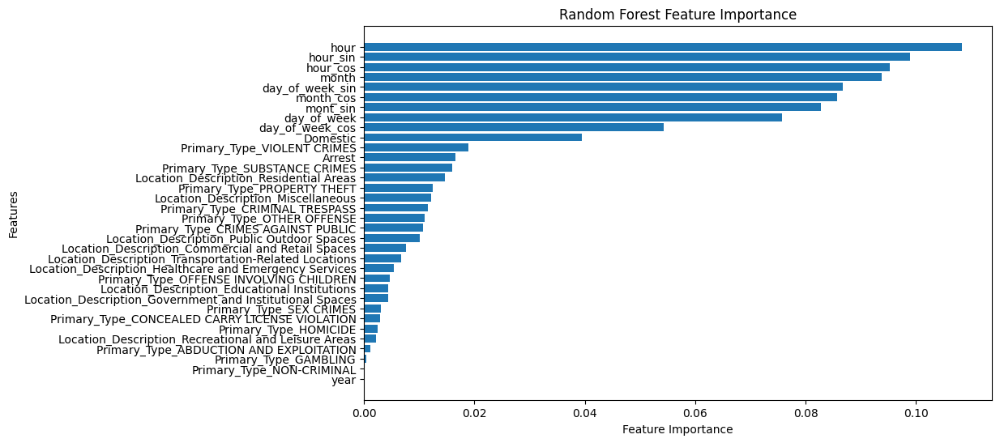

In [120]:
import matplotlib.pyplot as plt

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Random Forest Feature Importance")
plt.gca().invert_yaxis()
plt.show()


The analysis has clearly shown that some blocks face higher MSE in comparison to others. F1 scores say that the predictions are very accurate, and the heatmaps don't concur with the F1 scores' idea of accuracy.

In [121]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import numpy as np

# Ensure indices of y_test and predicted_df_test are aligned
aligned_indices = y_test.index.intersection(predicted_df_test.index)

# Filter both DataFrames to only include aligned indices
y_test = y_test.loc[aligned_indices]
predicted_df_test = predicted_df_test.loc[aligned_indices]

# Initialize a dictionary to store fairness results
fairness_results = {}

# Loop through each unique group in the 'Location' column
for group in y_test['Location'].unique():
    # Create a group mask to filter rows for the current group
    group_mask = y_test['Location'] == group

    # Extract rows for the current group
    group_indices = y_test.loc[group_mask].index
    y_true_group = y_test.loc[group_indices, 'Latitude']
    y_pred_group = predicted_df_test.loc[group_indices, 'Latitude']

    # Skip empty groups
    if y_true_group.empty or y_pred_group.empty:
        print(f"Skipping group {group} due to no matching rows.")
        continue

    # Convert continuous data into categorical bins for confusion matrix calculation
    y_true_group_cat = pd.cut(y_true_group, bins=10, labels=False)
    y_pred_group_cat = pd.cut(y_pred_group, bins=10, labels=False)

    # Ensure the lengths of true and predicted categories match
    if len(y_true_group_cat) != len(y_pred_group_cat):
        print(f"Skipping group {group} due to length mismatch.")
        continue

    # Compute confusion matrix
    cm = confusion_matrix(y_true_group_cat, y_pred_group_cat, labels=range(10))

    # Calculate True Positive Rate (TPR) and Predicted Positive Rate (PPR)
    tp = np.diag(cm)  # True Positives are the diagonal elements
    fn = np.sum(cm, axis=1) - tp  # False Negatives are row sums minus diagonal
    fp = np.sum(cm, axis=0) - tp  # False Positives are column sums minus diagonal
    total = np.sum(cm)  # Total samples in the group

    # Average TPR and PPR for the group
    tpr = np.mean(tp / (tp + fn + 1e-6))  # Avoid division by zero
    ppr = np.mean((tp + fp) / (total + 1e-6))  # Avoid division by zero

    # Store results in the fairness dictionary
    fairness_results[group] = {'TPR': tpr, 'PPR': ppr}

# Print fairness results for each group
for group, metrics in fairness_results.items():
    print(f"Group {group}: TPR = {metrics['TPR']:.3f}, PPR = {metrics['PPR']:.3f}")


Streaming output truncated to the last 5000 lines.
Group (41.850394236, -87.673705687): TPR = 0.100, PPR = 0.100
Group (41.875284419, -87.724348541): TPR = 0.100, PPR = 0.100
Group (41.888400017, -87.649883879): TPR = 0.100, PPR = 0.100
Group (41.69572968, -87.612239695): TPR = 0.100, PPR = 0.100
Group (41.845470807, -87.707502937): TPR = 0.100, PPR = 0.100
Group (41.840859176, -87.626847966): TPR = 0.000, PPR = 0.100
Group (41.778665397, -87.673891329): TPR = 0.100, PPR = 0.100
Group (41.754554351, -87.597995776): TPR = 0.100, PPR = 0.100
Group (41.751413744, -87.588448328): TPR = 0.100, PPR = 0.100
Group (41.976030801, -87.842422722): TPR = 0.100, PPR = 0.100
Group (41.779220641, -87.649632877): TPR = 0.000, PPR = 0.100
Group (41.88495447, -87.64274847): TPR = 0.000, PPR = 0.100
Group (41.797017413, -87.714000017): TPR = 0.100, PPR = 0.100
Group (41.910345931, -87.685432867): TPR = 0.100, PPR = 0.100
Group (41.758027836, -87.563929201): TPR = 0.100, PPR = 0.100
Group (41.732097927, -

In [122]:
# Check bin distribution for a specific group
print(y_test['Latitude'].describe())

# Check bin counts for one group
bins = pd.cut(y_test['Latitude'], bins=10, labels=False)
print(bins.value_counts())


count    40712.000000
mean        41.843235
std          0.085023
min         41.644608
25%         41.768827
50%         41.864170
75%         41.902799
max         42.022567
Name: Latitude, dtype: float64
Latitude
6    9954
3    6372
2    5257
7    4614
5    4025
4    3089
8    2864
1    2116
9    1607
0     814
Name: count, dtype: int64


In [123]:
# Increase bins to 20 or more
y_true_group_cat = pd.cut(y_true_group, bins=20, labels=False)
y_pred_group_cat = pd.cut(y_pred_group, bins=20, labels=False)


In [124]:
# Quantile-based binning
y_true_group_cat = pd.qcut(y_true_group, q=10, labels=False, duplicates='drop')
y_pred_group_cat = pd.qcut(y_pred_group, q=10, labels=False, duplicates='drop')


In [125]:
from sklearn.metrics import mean_squared_error

# Calculate RMSE for predictions
rmse = mean_squared_error(y_test['Latitude'], predicted_df_test['Latitude'], squared=False)
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")


Root Mean Squared Error (RMSE): 0.0947


In [126]:
quasi_identifiers = ['Latitude', 'Longitude', 'Block']
grouped = df.groupby(quasi_identifiers).size()
min_group_size = grouped.min()

print(f"Minimum group size: {min_group_size}")

# Define the value of k for k-anonymity
k = 1  # Example value, change to your desired k

if min_group_size >= k:
    print(f"The dataset satisfies {k}-anonymity.")
else:
    print(f"The dataset does not satisfy {k}-anonymity.")

Minimum group size: 1
The dataset satisfies 1-anonymity.


In [127]:
df['Latitude'] = df['Latitude'].round(2)
df['Longitude'] = df['Longitude'].round(2)


In [128]:
sensitive_attribute = 'Block'
diversity = df.groupby(quasi_identifiers)[sensitive_attribute].nunique()
min_diversity = diversity.min()

print(f"Minimum diversity in sensitive attributes: {min_diversity}")
l = 2
if min_diversity >= l:
    print(f"The dataset satisfies {l}-diversity.")
else:
    print(f"The dataset does not satisfy {l}-diversity.")


Minimum diversity in sensitive attributes: 1
The dataset does not satisfy 2-diversity.


In [129]:
from scipy.stats import entropy

# Global distribution of the sensitive attribute
global_distribution = df[sensitive_attribute].value_counts(normalize=True)

# Group distributions of the sensitive attribute
group_distributions = (
    df.groupby(quasi_identifiers)[sensitive_attribute]
    .value_counts(normalize=True)
    .unstack(fill_value=0)
)

# Iterate over groups and compute KL divergence
for group, distribution in group_distributions.iterrows():
    # Align distribution with global categories
    aligned_distribution = distribution.reindex(global_distribution.index, fill_value=0)

    # Compute KL divergence
    kl_divergence = entropy(aligned_distribution, global_distribution)
    print(f"Group: {group}, KL Divergence: {kl_divergence}")


Group: (36.62, -91.69), KL Divergence: 11.76823412788697
Group: (41.64, -87.61), KL Divergence: 10.963515171669918
Group: (41.64, -87.6), KL Divergence: 11.76823412788697
Group: (41.65, -87.62), KL Divergence: 7.670643185985783
Group: (41.65, -87.61), KL Divergence: 7.6440482168696136
Group: (41.65, -87.6), KL Divergence: 7.584821407526129
Group: (41.65, -87.59), KL Divergence: 10.44870546307934
Group: (41.65, -87.56), KL Divergence: 10.252796941302018
Group: (41.65, -87.55), KL Divergence: 7.912212854319519
Group: (41.65, -87.54), KL Divergence: 8.21684634641494
Group: (41.65, -87.53), KL Divergence: 9.738012622613759
Group: (41.66, -87.65), KL Divergence: 9.40388983979783
Group: (41.66, -87.64), KL Divergence: 7.142616214271108
Group: (41.66, -87.63), KL Divergence: 7.891883346273222
Group: (41.66, -87.62), KL Divergence: 7.8331972568988215
Group: (41.66, -87.61), KL Divergence: 7.063664466660536
Group: (41.66, -87.6), KL Divergence: 6.60955019955899
Group: (41.66, -87.59), KL Diverg

In [130]:
threshold = 0.1  # Set your threshold for t-closeness

# Calculate KL divergences and store them in a list
kl_divergences = []
for group, distribution in group_distributions.iterrows():
    # Align distribution with global categories
    aligned_distribution = distribution.reindex(global_distribution.index, fill_value=0)

    # Compute KL divergence and append to the list
    kl_divergences.append(entropy(aligned_distribution, global_distribution))

# Now use the list of KL divergences in the list comprehension
non_compliant_groups = [
    group for group, kl_divergence in zip(group_distributions.index, kl_divergences)
    if kl_divergence > threshold
]

print("Groups that do not satisfy t-closeness:")
print(non_compliant_groups)

Groups that do not satisfy t-closeness:
[(36.62, -91.69), (41.64, -87.61), (41.64, -87.6), (41.65, -87.62), (41.65, -87.61), (41.65, -87.6), (41.65, -87.59), (41.65, -87.56), (41.65, -87.55), (41.65, -87.54), (41.65, -87.53), (41.66, -87.65), (41.66, -87.64), (41.66, -87.63), (41.66, -87.62), (41.66, -87.61), (41.66, -87.6), (41.66, -87.59), (41.66, -87.58), (41.66, -87.56), (41.66, -87.55), (41.66, -87.54), (41.67, -87.66), (41.67, -87.65), (41.67, -87.64), (41.67, -87.63), (41.67, -87.62), (41.67, -87.6), (41.67, -87.58), (41.67, -87.57), (41.67, -87.56), (41.67, -87.55), (41.67, -87.54), (41.68, -87.73), (41.68, -87.72), (41.68, -87.71), (41.68, -87.69), (41.68, -87.68), (41.68, -87.67), (41.68, -87.66), (41.68, -87.65), (41.68, -87.64), (41.68, -87.63), (41.68, -87.62), (41.68, -87.61), (41.68, -87.6), (41.68, -87.58), (41.68, -87.56), (41.68, -87.55), (41.68, -87.54), (41.68, -87.53), (41.69, -87.74), (41.69, -87.73), (41.69, -87.72), (41.69, -87.71), (41.69, -87.7), (41.69, -87.6

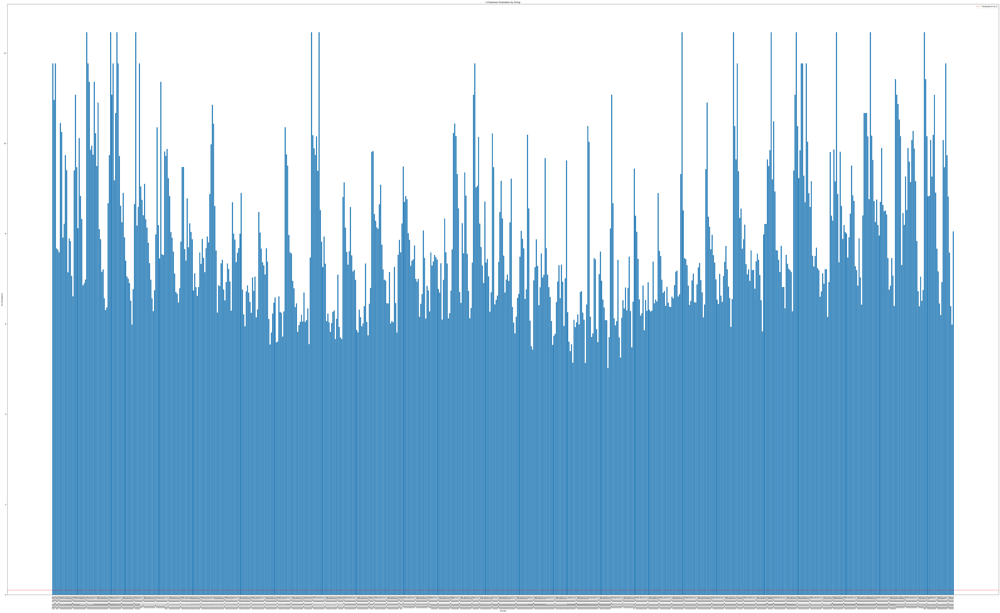

In [131]:
# Convert the MultiIndex to a list of tuples, then convert each tuple to a string
x_labels = [str(tuple(label)) for label in group_distributions.index]

plt.figure(figsize=(100, 60))
plt.bar(x_labels, kl_divergence_values)  # Use x_labels instead of the MultiIndex
plt.axhline(y=threshold, color='r', linestyle='--', label=f'Threshold (t={threshold})')
plt.xlabel("Groups")
plt.ylabel("KL Divergence")
plt.title("t-Closeness Evaluation by Group")
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [132]:
unique_records = df.groupby(quasi_identifiers).size() == 1
reidentification_risk = unique_records.sum() / len(df)

print(f"Re-identification risk: {reidentification_risk * 100:.2f}%")

Re-identification risk: 2.22%


In [133]:
import numpy as np

epsilon = 0.1  # Privacy budget
sensitivity = 1.0  # Sensitivity of the feature
df['Latitude_noisy'] = df['Latitude'] + np.random.laplace(0, sensitivity / epsilon, size=len(df))
df['Longitude_noisy'] = df['Longitude'] + np.random.laplace(0, sensitivity / epsilon, size=len(df))


In [134]:
# Replace original features with noisy ones
df['Latitude'] = df['Latitude_noisy']
df['Longitude'] = df['Longitude_noisy']

# Re-split and retrain the model
X_train_noisy, X_test_noisy, y_train_noisy, y_test_noisy = train_test_split(
    X, df[['Latitude', 'Longitude']], test_size=0.2, random_state=42
)
lat_model_noisy = RandomForestRegressor(random_state=42)
lat_model_noisy.fit(X_train_noisy, y_train_noisy['Latitude'])


RandomForestRegressor(random_state=42)

In [135]:
from sklearn.metrics import mean_squared_error

y_lat_pred_noisy = lat_model_noisy.predict(X_test_noisy)
lat_mse_noisy = mean_squared_error(y_test_noisy['Latitude'], y_lat_pred_noisy)

print(f"Latitude MSE with noise: {lat_mse_noisy:.4f}")


Latitude MSE with noise: 238.2358


In [136]:
print(f"Latitude MSE without noise: {lat_mse:.4f}")

Latitude MSE without noise: 0.0052
